# Right-of-Way Semantic Segmentation for Urban Areas using GeoNRW
### MUSA 650 Final Project

**Authors: Benjamin She, Eli Ericson**

In [1]:
import os, cv2

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

from glob import glob
from random import sample
from IPython.display import clear_output
from matplotlib import colors
from sklearn.metrics import jaccard_score, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Input, concatenate
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, Dropout
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.utils import plot_model

2022-05-18 09:25:43.742406: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


## Image preprocessing

### Define parameters and functions

In [2]:
# define read-in params

BASEDIR = 'data'

# dataset file structure has each city's images in a separate subdirectory
CITIES = ['koeln']
# CITIES = ['koeln','essen','dortmund','duesseldorf','duisburg']

CLASSES = {
    0:'forest',
    1:'water',
    2:'agricultural',
    3:'urban_fabric',
    4:'grassland',
    5:'railway',
    6:'highway',
    7:'air_ship',
    8:'road',
    9:'building',
    10: 'non-transportation',
    11: 'transportation'}

# mapping to collapse non-transportation classes for five-class schema
classmap_5 = {
    0: 0, 
    1: 0, 
    2: 0, 
    3: 0, 
    4: 0, 
    5: 1, 
    6: 2, 
    7: 3, 
    8: 4, 
    9: 0}

# mapping to assign colormap-compatible values to five-class schema
backmap_5 = {
    0: 10, 
    1: 5,
    2: 6,
    3: 7,
    4: 8}

# mapping to create binary schema (transportation vs. non-transportation)
classmap_2 = {
    0: 0, 
    1: 0, 
    2: 0, 
    3: 0, 
    4: 0, 
    5: 1, 
    6: 1, 
    7: 1, 
    8: 1, 
    9: 0}

# mapping to assign colormap-compatible values to binary schema
backmap_2 = {
    0: 10, 
    1: 11 }

# display labels for plotting by number of classes
display_labels = {
    2: ['non-transportation', 'transportation'],
    5: ['non-transportation', 'railway', 'highway', 'airport/shipyard', 'road'],
    10: ['forest', 'water', 'agricultural', 'urban fabric', 'grassland', 'railway', 'highway', 
         'airport/shipyard', 'road', 'building']
}

# scaler to normalize images
scaler = StandardScaler()

In [3]:
# define segmentation mask color map and function to plot it
# adapted from GeoNRW repo: https://github.com/gbaier/geonrw/blob/main/plot_rgb_examples.py

cmap = colors.ListedColormap(
    [
        "#2ca02c",  # green for forest
        "#1f77b4",  # blue for water
        "#8c564b",  # brown for agricultural
        "#7f7f7f",  # gray for urban fabric
        "#bcbd22",  # olive for grassland
        "#ff7f0e",  # orange for railway
        "#9467bd",  # purple for highway
        "#17becf",  # cyan for airports and shipyards
        "#d62728",  # red for roads
        "#e377c2",  # pink for buildings
        "#f5f6f7",  # light gray for non-transportation when collapsed
        '#1292a1',  # teal for transportation when collapsed
    ]
)

cmap_norm = colors.Normalize(vmin=0, vmax=11)

In [4]:
# define mapping functions

def remap(mask, map_dict):
    """Recodes mask values according to input dict. Use to create
    reduced-class masks or to map their values back to cmap values.
    """ 
    new_mask = np.zeros_like(mask)
    
    for k, v in map_dict.items():
        new_mask[mask == k] = v
        
    return new_mask

def seg2rgb(seg_map, n_classes):
    """Converts segmentation map to plottable RGB image. """
    map_switch = {
        10: seg_map,
        5: remap(seg_map, backmap_5),
        2: remap(seg_map, backmap_2)}
    seg_map = map_switch[n_classes]
    return cmap(cmap_norm(np.squeeze(seg_map)))[:, :, :3]

In [5]:
# define read-in, display, and preprocessing functions

def read_image(dir):
    """Reads image from directory, resizes to a size divisible by
    32, and normalizes. Returns image as float array.
    """
    x = cv2.imread(dir, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (1024, 1024))
    x = x.astype(np.float32)
    x /= 255
    return x

def read_mask(dir):
    """Reads segmentation mask from directory. Resizes to a size
    divisible by 32 using nearest neighbor interpolation to avoid 
    artifacts. Subtracts 1 from class values to start labels at 0, 
    not 1. Returns mask as integer array.
    """
    x = cv2.imread(dir, cv2.IMREAD_GRAYSCALE)
    x = cv2.resize(x, (1024, 1024), interpolation=cv2.INTER_NEAREST)
    x = np.expand_dims(x, axis=-1)
    x = x.astype(np.uint8)
    x -= 1
    return x

def apply_scaler(images):
    """Applies scaler defined in params to image array."""
    
    images_scaled = scaler.fit_transform(images.reshape(images.shape[0], -1)).reshape(images.shape)
    
    return images_scaled

def reverse_scaler(images):
    """Reverses scaler to plot images in true color."""
    
    input_shape = images.shape
    
    if len(input_shape) == 3:
        images = np.expand_dims(images, 0)
    
    images_flattened = images.reshape(images.shape[0], -1)
    images_unscaled = scaler.inverse_transform(images_flattened).reshape(input_shape)
    
    return images_unscaled

def show_img_mask(images, masks, i, n_classes):
    """Displays an image and its mask for a given index value."""
    plt.figure(figsize=(18, 8))
    title = ['Input Image', 'True Mask']
    display_list = [images[i], seg2rgb(masks[i], n_classes)]
    if display_list[0].shape[0] != images_full[0].shape[0]:
        display_list[0] = reverse_scaler(display_list[0])
    for j in range(len(display_list)):
        plt.subplot(1, len(display_list), j+1)
        plt.title(title[j])
        plt.imshow(display_list[j])
        plt.axis('off')
    plt.show()  

In [82]:
# get image and mask file paths, and print lengths

filesImg, filesMsk = [], []

for city in CITIES:
    filesImg.extend(glob(os.path.join(BASEDIR,city,"*.jp2")))
    filesMsk.extend(glob(os.path.join(BASEDIR,city,"*seg.tif")))

filesImg.sort()
filesMsk.sort()

print(f"Images: {len(filesImg)} - Masks: {len(filesMsk)}")

LEN_DATA = len(filesImg)

Images: 479 - Masks: 479


### Read images and masks

In [83]:
images_full, masks_full = [], []

for imgFile in filesImg:
    images_full.append(read_image(imgFile))
for mskFile in filesMsk:
    masks_full.append(read_mask(mskFile))

images_full = np.asarray(images_full)
masks_full = np.asarray(masks_full)

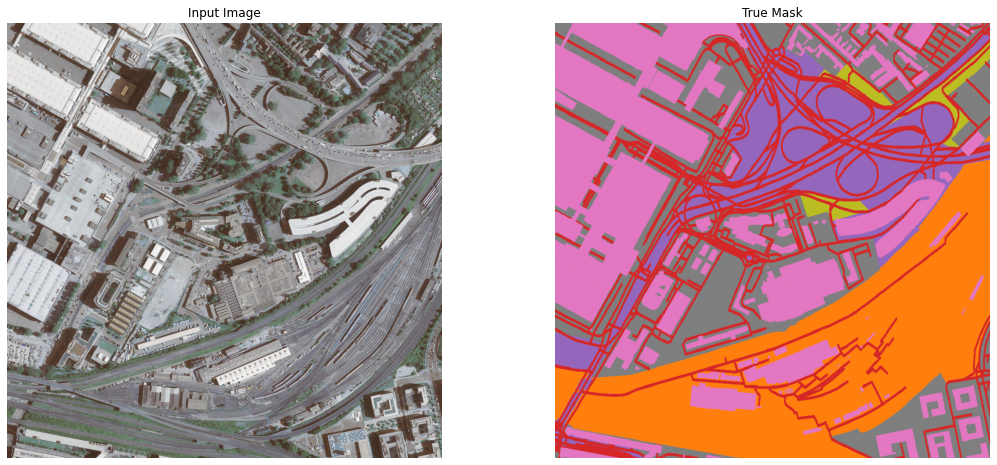

In [84]:
show_img_mask(images_full, masks_full, 266, n_classes=10)

### Split images and masks to create 10-class dataset, and normalize images

In [85]:
# split images and masks in 16 as orthoimagery scale is too big

images, masks = [], []

M = images_full[0].shape[0] // 4
N = images_full[0].shape[1] // 4

for im in images_full:
    images.extend([im[x:x+M, y:y+N] for x in range(0, im.shape[0], M) for y in range(0, im.shape[1], N)])

for mk in masks_full:
    masks.extend([mk[x:x+M, y:y+N] for x in range(0, mk.shape[0], M) for y in range(0, mk.shape[1], N)])

images = np.asarray(images)
masks = np.asarray(masks)

In [86]:
# normalize images
images = apply_scaler(images)

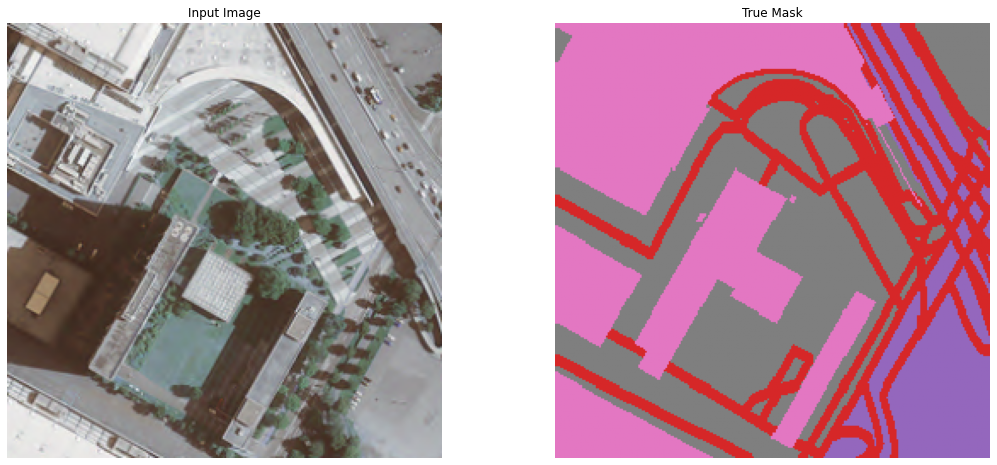

In [87]:
show_img_mask(images, masks, 4257, n_classes=10)

In [88]:
images.shape

(7664, 256, 256, 3)

### Collapse non-transportation classes to create five-class masks

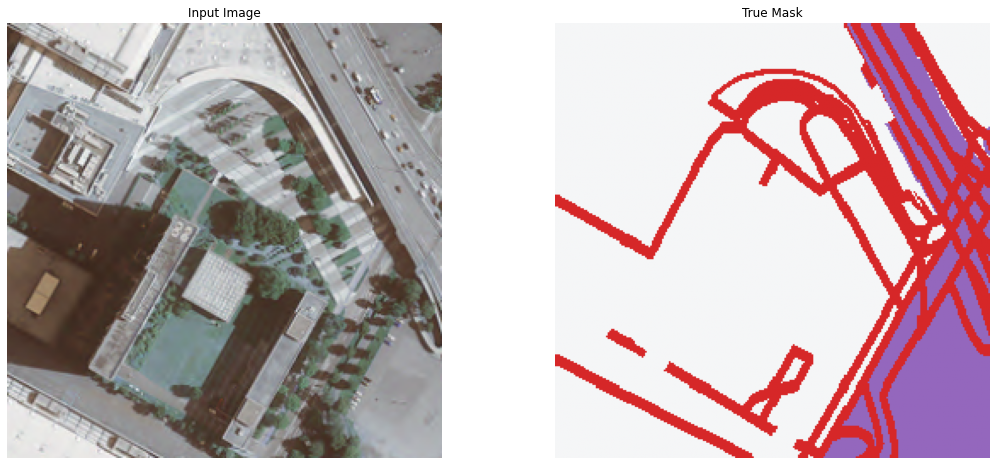

In [12]:
masks_5 = remap(masks, classmap_5)

show_img_mask(images, masks_5, 4257, n_classes=5)

### Collapse transportation and non-transportation classes to create binary masks

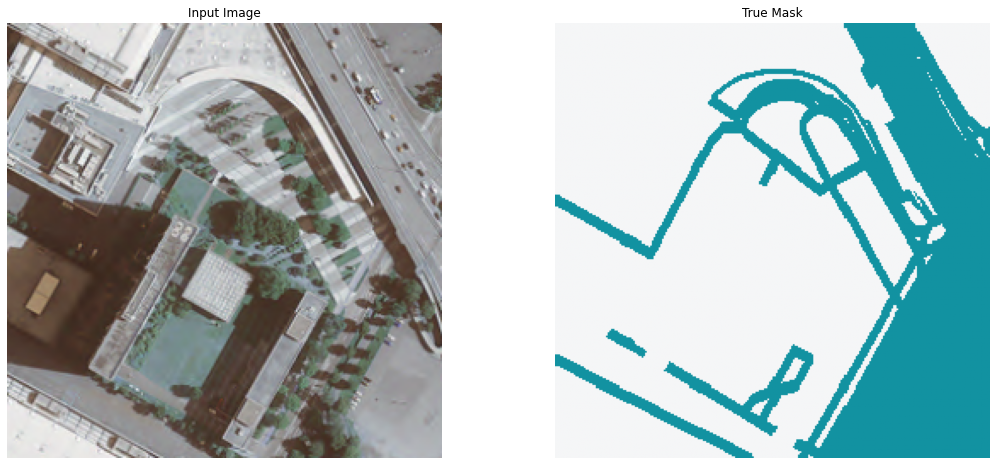

In [13]:
masks_2 = remap(masks, classmap_2)

show_img_mask(images, masks_2, 4257, n_classes=2)

## Data exploration

In [14]:
def getMaskClasses(masklist, numClasses):
    """Returns a dict with the indices of masks sorted by the number of classes
    present in them."""
    # get the classes present on each mask
    classesPresent = np.array([np.unique(mask) for mask in masklist], dtype=object)
    
    # create empty dictionary
    totClassDict = {}

    # classify images by number of classes present in each
    for i in range(1, numClasses+1):
        totalClasses = np.where(np.asarray([array.shape[0] for array in classesPresent]) == i)
        totClassDict[i] = totalClasses[0]
    
    return totClassDict

### All classes

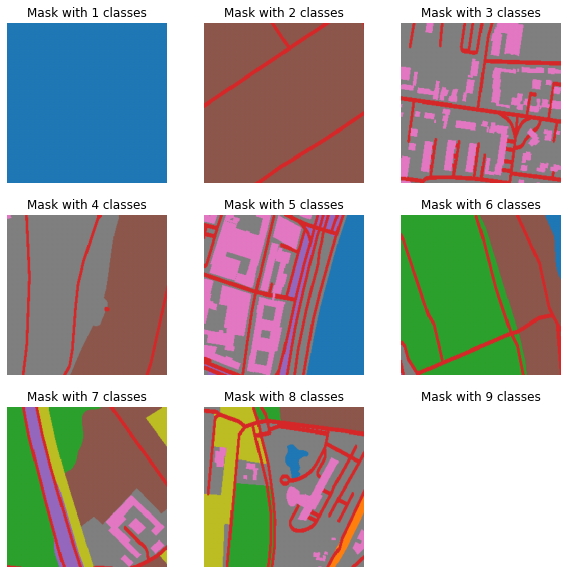

In [15]:
NUM_CLASSES =  10

# get mask indices by number of classes present
mskByClass = getMaskClasses(masks, NUM_CLASSES)

# plot examples of images with different numbers of classes
fig, axes = plt.subplots(figsize=(10,10), nrows=3, ncols=3, sharey=True)
[axi.set_axis_off() for axi in axes.ravel()]

for i in range(NUM_CLASSES-1):
    ax = axes.flatten()[i]
    ax.set_title(f'Mask with {i+1} classes')
    classMsk = masks[mskByClass[i+1]]
    if np.any(classMsk):
        idx = np.random.randint(classMsk.shape[0])
        mask = masks[mskByClass[i+1][idx]]
        ax.imshow(seg2rgb(mask, n_classes=NUM_CLASSES), vmin=0, vmax=NUM_CLASSES)
        ax.set_xlabel(idx)

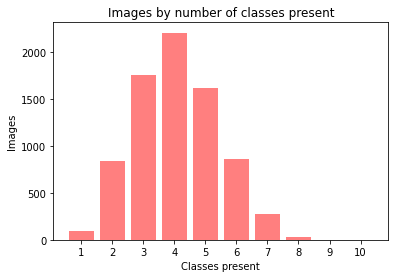

In [16]:
# get total of images per number of classes present
totByClass = [mskByClass[i].shape[0] for i in range(1, NUM_CLASSES+1)]

# plot bar
plt.figure(figsize=(6, 4))
plt.bar(range(1, NUM_CLASSES+1), totByClass, align='center', color='red', alpha=0.5)
plt.xticks(range(1, NUM_CLASSES+1))
plt.ylabel('Images')
plt.xlabel('Classes present')
plt.title("Images by number of classes present")
plt.show()

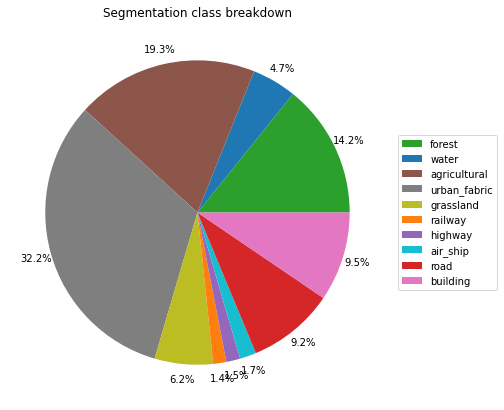

In [17]:
(classNum, counts) = np.unique(masks, return_counts=True)
classNames = np.vectorize(CLASSES.get)(classNum)

plt.figure(figsize=(7, 7))
plt.pie(counts, labels=classNames, colors=cmap.colors, autopct='%1.1f%%', pctdistance=1.1, labeldistance=None)
plt.title("Segmentation class breakdown")
plt.legend(loc="center right", bbox_to_anchor=(0.8, 0, 0.5, 1))
plt.show()

### Reduced classes
Transportation classes distinct, all others collapsed.

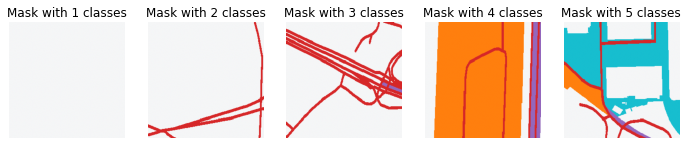

In [18]:
NUM_CLASSES = 5

# get mask indices by number of classes present
mskByClass = getMaskClasses(masks_5, NUM_CLASSES)

# plot examples of images with different numbers of classes
fig, axes = plt.subplots(figsize=(12, 3), nrows=1, ncols=NUM_CLASSES, sharey=True)
[axi.set_axis_off() for axi in axes.ravel()]

for i in range(NUM_CLASSES):
    ax = axes.flatten()[i]
    ax.set_title(f'Mask with {i+1} classes')
    classMsk = masks_5[mskByClass[i+1]]
    if np.any(classMsk):
        idx = np.random.randint(classMsk.shape[0])
        mask = masks_5[mskByClass[i+1][idx]]
        ax.imshow(seg2rgb(mask, NUM_CLASSES), vmin=0, vmax=NUM_CLASSES)

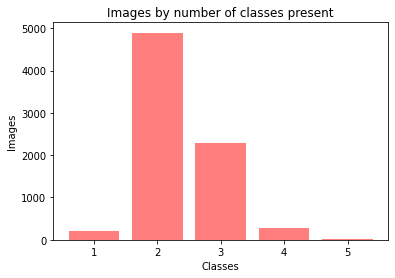

In [19]:
# get total of images per number of classes present
totByClass = [mskByClass[i].shape[0] for i in range(1,NUM_CLASSES+1)]

# plot bar
plt.bar(range(1,NUM_CLASSES+1), totByClass, align='center', color='red', alpha=0.5)
plt.xticks(range(1, NUM_CLASSES+1))
plt.ylabel('Images')
plt.xlabel('Classes')
plt.title("Images by number of classes present")
plt.show()

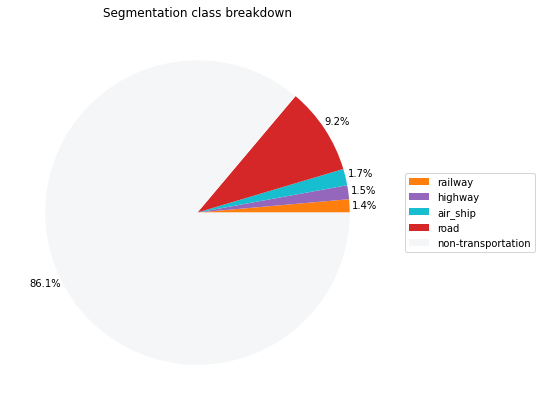

In [20]:
(classNum, counts) = np.unique(remap(masks_5, backmap_5), return_counts=True)
classNames = np.vectorize(CLASSES.get)(classNum)

# get reduced color map to match classes
colors_5 = [cmap.colors[i] for i in classNum]

plt.figure(figsize=(7, 7))
plt.pie(counts, labels=classNames, colors=colors_5, autopct='%1.1f%%', pctdistance=1.1, labeldistance=None)
plt.title("Segmentation class breakdown")
plt.legend(loc="center right", bbox_to_anchor=(0.9, 0, 0.5, 1))
plt.show()

### Binary classes

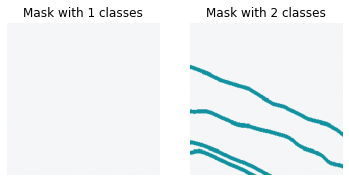

In [21]:
NUM_CLASSES = 2

# get mask indices by number of classes present
mskByClass = getMaskClasses(masks_2, NUM_CLASSES)

# plot examples of images with different numbers of classes
fig, axes = plt.subplots(figsize=(6, 3), nrows=1, ncols=NUM_CLASSES, sharey=True)
[axi.set_axis_off() for axi in axes.ravel()]

for i in range(NUM_CLASSES):
    ax = axes.flatten()[i]
    ax.set_title(f'Mask with {i+1} classes')
    classMsk = masks_2[mskByClass[i+1]]
    if np.any(classMsk):
        idx = np.random.randint(classMsk.shape[0])
        mask = masks_2[mskByClass[i+1][idx]]
        ax.imshow(seg2rgb(mask, NUM_CLASSES), vmin=0, vmax=NUM_CLASSES)

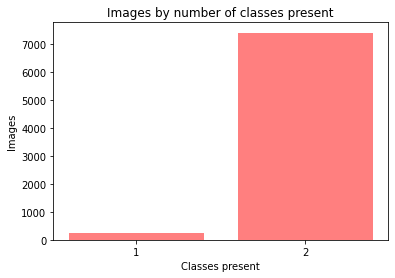

In [22]:
# get total images per number of classes present
totByClass = [mskByClass[i].shape[0] for i in range(1,NUM_CLASSES+1)]

# plot bar
plt.bar(range(1, NUM_CLASSES+1), totByClass, align='center', color='red', alpha=0.5)
plt.xticks(range(1, NUM_CLASSES+1))
plt.ylabel('Images')
plt.xlabel('Classes present')
plt.title("Images by number of classes present")
plt.show()

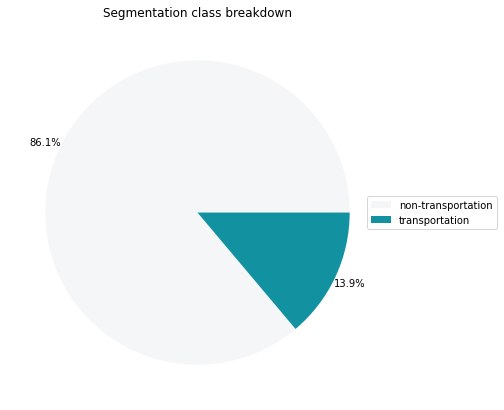

In [23]:
(classNum, counts) = np.unique(remap(masks_2, backmap_2), return_counts=True)
classNames = np.vectorize(CLASSES.get)(classNum)

# get reduced color map to match classes
colors = [cmap.colors[i] for i in classNum]

plt.figure(figsize=(7, 7))
plt.pie(counts, labels=classNames, colors=colors, autopct='%1.1f%%', pctdistance=1.1, labeldistance=None)
plt.title("Segmentation class breakdown")
plt.legend(loc="center right", bbox_to_anchor=(0.8, 0, 0.5, 1))
plt.show()

## U-Net models

In [24]:
# define params

SEED = 650
IMG_SIZE = images[0].shape[0]
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

BATCH_SIZE = 2

In [25]:
# define U-Net building blocks and function
# adapted from https://pyimagesearch.com/2022/02/21/u-net-image-segmentation-in-keras/

def downsample_block(x, n_filters, dropout=0.1):
    f = double_conv_block(x, n_filters, dropout)
    p = MaxPooling2D(2)(f)
    return f, p

def double_conv_block(x, n_filters, dropout):
    x = Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
    x = Dropout(dropout)(x)
    x = Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
    x = Dropout(dropout)(x)
    return x

def upsample_block(x, conv_features, n_filters, dropout=0.1):
    x = Conv2DTranspose(n_filters, (2, 2), strides=(2, 2), padding="same")(x)
    x = concatenate([x, conv_features])
    x = double_conv_block(x, n_filters, dropout)
    return x

def build_unet():    
    # inputs
    inputs = Input(shape=INPUT_SHAPE)
    
    # encoder: contracting dir - downsample
    # 1 - downsample
    f1, p1 = downsample_block(inputs, 32, dropout=0.1)
    # 2 - downsample
    f2, p2 = downsample_block(p1, 64, dropout=0.1)
    # 3 - downsample
    f3, p3 = downsample_block(p2, 128, dropout=0.2)
    # 4 - downsample
    f4, p4 = downsample_block(p3, 256, dropout=0.2)
    
    # 5 - bottleneck
    bottleneck = double_conv_block(p4, 512, dropout=0.3)
    
    # decoder: expanding dir - upsample
    # 6 - upsample
    u6 = upsample_block(bottleneck, f4, 256, dropout=0.2)
    # 7 - upsample
    u7 = upsample_block(u6, f3, 128, dropout=0.2)
    # 8 - upsample
    u8 = upsample_block(u7, f2, 64, dropout=0.1)
    # 9 - upsample
    u9 = upsample_block(u8, f1, 32, dropout=0.1)
    
    # outputs
    outputs = Conv2D(NUM_CLASSES, 1, padding="same", activation = "softmax")(u9)
    
    # unet model with Keras Functional API
    unet_model = tf.keras.Model(inputs, outputs, name="U-Net")
    
    return unet_model

In [26]:
# redefine Keras MIoU to work with sparse categorical crossentropy
# drawn from https://stackoverflow.com/a/61826074/6221738

class miou(tf.keras.metrics.MeanIoU):
    def __init__(self,
                 y_true=None,
                 y_pred=None,
                 num_classes=None,
                 name=None,
                 dtype=None):
        super(miou, self).__init__(num_classes=num_classes,name=name, dtype=dtype)
        
    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.math.argmax(y_pred, axis=-1)
        return super().update_state(y_true, y_pred, sample_weight)

In [27]:
# define functions and callback to display sample prediction
# adapted from https://www.tensorflow.org/tutorials/images/segmentation

def display_sample(display_list):
    plt.figure(figsize=(18, 8))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    
    display_list[0] = reverse_scaler(display_list[0])
    
    for i in range(len(display_list)):
        if i > 0:
            display_list[i] = seg2rgb(display_list[i], NUM_CLASSES)
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()
    
def create_mask(pred_mask):
    pred_mask = tf.math.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

def show_predictions(dataset=None, num=1):
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image[tf.newaxis, ...])
            display_sample([image[0], mask[0], create_mask(pred_mask)])
    else:
        pred_mask = create_mask(model.predict(sample_image[tf.newaxis, ...]))
        display_sample([sample_image, sample_mask, pred_mask])
        
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        clear_output(wait=True)
        show_predictions()
        print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

In [28]:
# define function to plot loss by epoch
# adapted from https://www.tensorflow.org/tutorials/images/segmentation

def plot_loss_history():
    """Plots training and validation loss by epoch."""
    loss = model_history.history['loss']
    val_loss = model_history.history['val_loss']

    plt.figure()
    plt.plot(model_history.epoch, loss, 'b', label='Training loss')
    plt.plot(model_history.epoch, val_loss, '--r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss value')
    plt.ylim([0, 1])
    plt.legend()
    plt.show()

In [78]:
# define a few more functions
# was pretty happy with the first one, to be honest

def show_prediction_grid(X, y_true, y_pred, idx_list):
    """Plots a grid of images, masks, and segmentations."""
    
    cols = ['Input Image', 'True Mask', 'Predicted Mask']

    fig, axes = plt.subplots(ncols=3, nrows=len(idx_list), figsize=(9, len(idx_list) * 3))

    for ax, col in zip(axes[0], cols):
        ax.set_title(col)

    for i in range(len(idx_list)):
        idx = idx_list[i]
        img = reverse_scaler(X[idx])
        msk = seg2rgb(y_true[idx], NUM_CLASSES)
        pred = seg2rgb(y_pred[idx], NUM_CLASSES)
        axes[i, 0].imshow(img)
        axes[i, 1].imshow(msk)
        axes[i, 2].imshow(pred)
        [axi.set_axis_off() for axi in axes.ravel()]

    fig.tight_layout()
    
def print_iou():
    """Prints intersection over union (IoU)/Jaccard score by class."""
    jaccard_tr = jaccard_score(y_tr.flatten(), segmentations_tr.flatten(), average=None)
    jaccard_te = jaccard_score(y_te.flatten(), segmentations_te.flatten(), average=None)

    classes_present = np.unique(np.append(y_tr, y_te))
    
    for i in range(len(classes_present)):
        class_num = classes_present[i]
        print(f'class {class_num}: {display_labels[NUM_CLASSES][class_num]}')
        print(f'training IOU: {round(jaccard_tr[i], 3)}')
        print(f'test IOU: {round(jaccard_te[i], 3)}\n')

### Binary segmentation

In [30]:
NUM_CLASSES=2

model = build_unet()

model.summary()

2022-05-18 09:27:58.566221: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2022-05-18 09:27:58.595875: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-18 09:27:58.596129: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:2b:00.0 name: NVIDIA GeForce GTX 1080 computeCapability: 6.1
coreClock: 1.7335GHz coreCount: 20 deviceMemorySize: 7.92GiB deviceMemoryBandwidth: 298.32GiB/s
2022-05-18 09:27:58.596145: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2022-05-18 09:27:58.597117: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2022-05-18 09:27:58.598367: I tensorflow/stream_executor/pl

Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 256, 256, 32) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 32) 9248        dropout[0][0]                    
______________________________________________________________________________________________

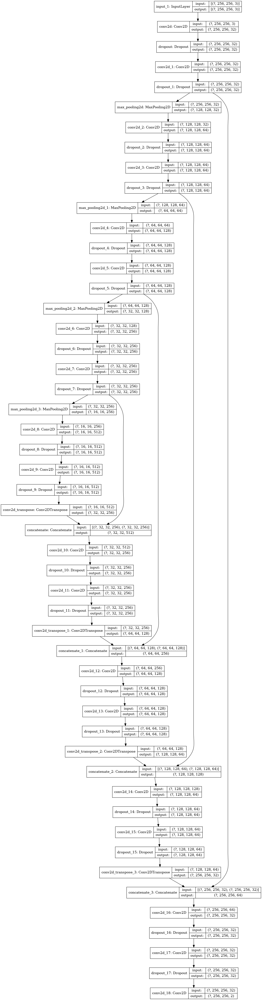

In [31]:
plot_model(model, show_shapes=True, show_layer_names=True)

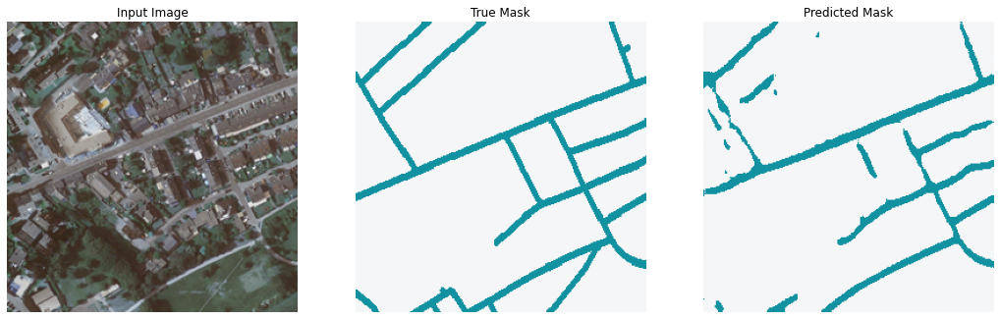


Sample Prediction after epoch 40


Epoch 00040: ReduceLROnPlateau reducing learning rate to 5.000000328436726e-07.
200/200 [==============================] - 10s 52ms/step - loss: 0.1310 - miou: 0.7527 - accuracy: 0.9495 - val_loss: 0.1973 - val_miou: 0.7106 - val_accuracy: 0.9331


In [32]:
NUM_CLASSES = 2

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
              loss=SparseCategoricalCrossentropy(from_logits=False,
                                                 reduction="auto",
                                                 name="sparse_categorical_crossentropy"),
              metrics=[miou(num_classes=NUM_CLASSES), "accuracy"])

X_tr, X_te, y_tr, y_te = train_test_split(
    images[500:1000],
    masks_2[500:1000],
    test_size = 0.2,
    shuffle = True,
    random_state = SEED)

sample_image, sample_mask = (X_tr[99], y_tr[99])

NUM_EPOCHS = 40
# TRAIN_SIZE = len(X_tr)
# TEST_SIZE = len(X_te)
# STEPS_PER_EPOCH = TRAIN_SIZE // BATCH_SIZE
# VALIDATION_STEPS = TEST_SIZE // BATCH_SIZE

callbacks = [
    # show samples after each epoch
    DisplayCallback(),
    # stop training early if loss stops improving
    EarlyStopping(monitor = 'val_loss', patience=20, verbose=1),
    # reduce learning rate if loss plateaus
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, verbose=1, min_delta=1e-4)
]

model_history = model.fit(x = X_tr, y = y_tr,
                          batch_size=BATCH_SIZE,
                          epochs=NUM_EPOCHS,
                          # steps_per_epoch=STEPS_PER_EPOCH,
                          # validation_steps=VALIDATION_STEPS,
                          validation_data=(X_te, y_te),
                          verbose=1,
                          callbacks=callbacks)

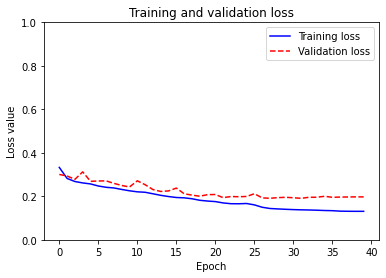

In [33]:
plot_loss_history()

#### Jaccard score (intersection over union) by class

In [34]:
predictions_tr = model.predict(X_tr, batch_size=4, verbose=0)
segmentations_tr = np.argmax(predictions_tr, axis=-1)

predictions_te = model.predict(X_te, batch_size=4, verbose=0)
segmentations_te = np.argmax(predictions_te, axis=-1)

print_iou()

class 0: non-transportation
training IOU: 0.948
test IOU: 0.928

class 1: transportation
training IOU: 0.58
test IOU: 0.493



#### Plot sample predictions

In [35]:
idx_list = sample(range(len(y_te)), 5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


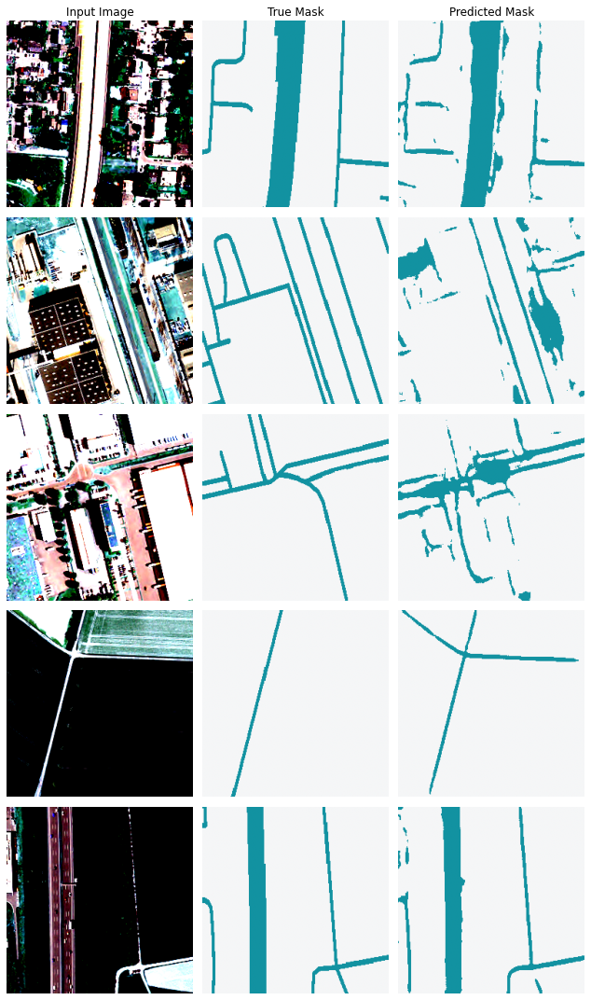

In [36]:
show_prediction_grid(X_te, y_te, segmentations_te, idx_list)

#### Pixel-level confusion matrix

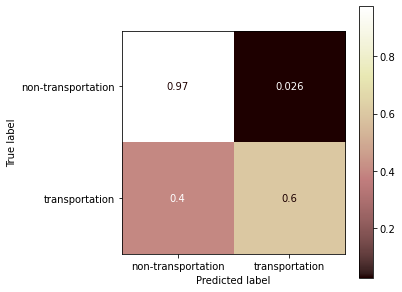

In [37]:
fig, ax = plt.subplots(figsize=(5, 5))
ConfusionMatrixDisplay.from_predictions(y_te.flatten(), segmentations_te.flatten(), 
                                        labels=range(NUM_CLASSES), display_labels=display_labels[NUM_CLASSES], 
                                        normalize='true', cmap='pink', ax=ax)

#### Plot a sample prediction by channel

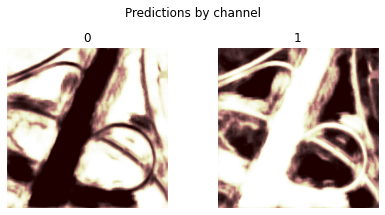

In [38]:
idx = 92

prediction = predictions_te[idx]
segmentation = segmentations_te[idx]

fig, axs = plt.subplots(nrows=1, ncols=prediction.shape[-1], figsize=(6, 3))
plt.suptitle('Predictions by channel')
[axi.set_axis_off() for axi in axs.ravel()]
for i, ax in enumerate(axs):
    ax.imshow(np.squeeze(prediction[..., i]), vmin=0, vmax=1, cmap='pink')
#    ax.set_xticks([])
#    ax.set_yticks([])
    ax.set_title(i)
plt.tight_layout()

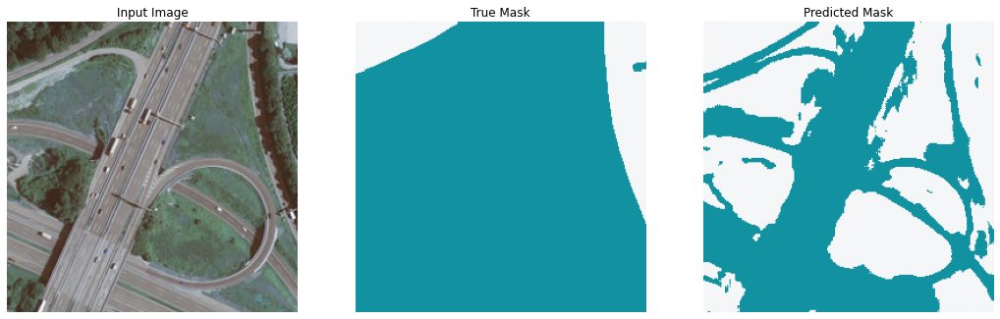

In [39]:
display_sample([X_te[idx], y_te[idx], segmentation])

### Multiclass segmentation: Five classes

In [40]:
NUM_CLASSES=5

model = build_unet()

model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_19 (Conv2D)              (None, 256, 256, 32) 896         input_2[0][0]                    
__________________________________________________________________________________________________
dropout_18 (Dropout)            (None, 256, 256, 32) 0           conv2d_19[0][0]                  
__________________________________________________________________________________________________
conv2d_20 (Conv2D)              (None, 256, 256, 32) 9248        dropout_18[0][0]                 
______________________________________________________________________________________________

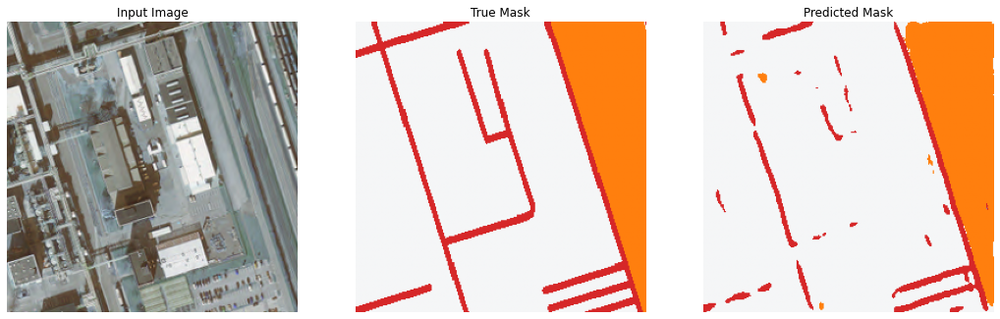


Sample Prediction after epoch 40

200/200 [==============================] - 11s 54ms/step - loss: 0.1377 - miou_1: 0.7041 - accuracy: 0.9486 - val_loss: 0.2163 - val_miou_1: 0.5728 - val_accuracy: 0.9321


In [41]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
              loss=SparseCategoricalCrossentropy(from_logits=False,
                                                 reduction="auto",
                                                 name="sparse_categorical_crossentropy"),
              metrics=[miou(num_classes=NUM_CLASSES), "accuracy"])

X_tr, X_te, y_tr, y_te = train_test_split(
    images[500:1000],
    masks_5[500:1000],
    test_size = 0.2,
    shuffle = True,
    random_state = SEED)

sample_image, sample_mask = (X_tr[58], y_tr[58])

NUM_EPOCHS = 40

callbacks = [
    # show samples after each epoch
    DisplayCallback(),
    # stop training early if loss stops improving
    EarlyStopping(monitor = 'val_loss', patience=20, verbose=1),
    # reduce learning rate if learning plateaus
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, verbose=1, min_delta=1e-4)
]

model_history = model.fit(x = X_tr, y = y_tr,
                          batch_size=BATCH_SIZE,
                          epochs=NUM_EPOCHS,
                          validation_data=(X_te, y_te),
                          verbose=1,
                          callbacks=callbacks)

#### Loss curve

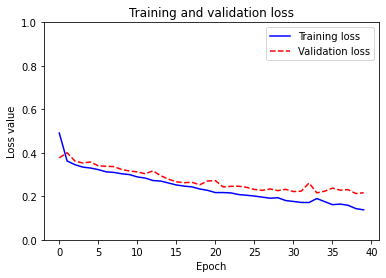

In [42]:
plot_loss_history()

#### Jaccard score (intersection over union) by class

In [43]:
predictions_tr = model.predict(X_tr, batch_size=4, verbose=0)
segmentations_tr = np.argmax(predictions_tr, axis=-1)

predictions_te = model.predict(X_te, batch_size=4, verbose=0)
segmentations_te = np.argmax(predictions_te, axis=-1)

print_iou()

class 0: non-transportation
training IOU: 0.952
test IOU: 0.933

class 1: railway
training IOU: 0.802
test IOU: 0.496

class 2: highway
training IOU: 0.61
test IOU: 0.417

class 4: road
training IOU: 0.532
test IOU: 0.445



#### Pixel-level confusion matrix

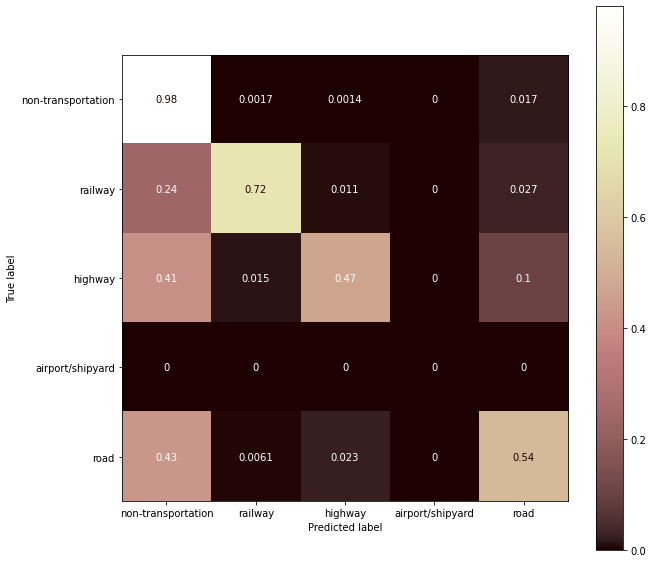

In [44]:
fig, ax = plt.subplots(figsize=(10, 10))
ConfusionMatrixDisplay.from_predictions(y_te.flatten(), segmentations_te.flatten(), 
                                        labels=range(NUM_CLASSES), display_labels=display_labels[NUM_CLASSES], 
                                        normalize='true', cmap='pink', ax=ax)

#### Plot sample predictions

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


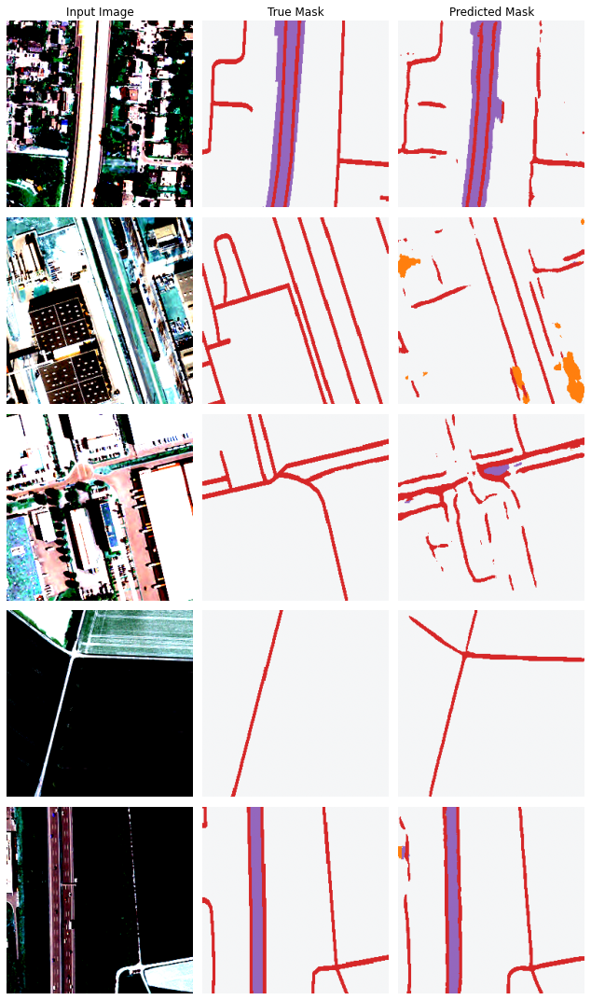

In [45]:
show_prediction_grid(X_te, y_te, segmentations_te, idx_list)

#### Plot predictions by channel

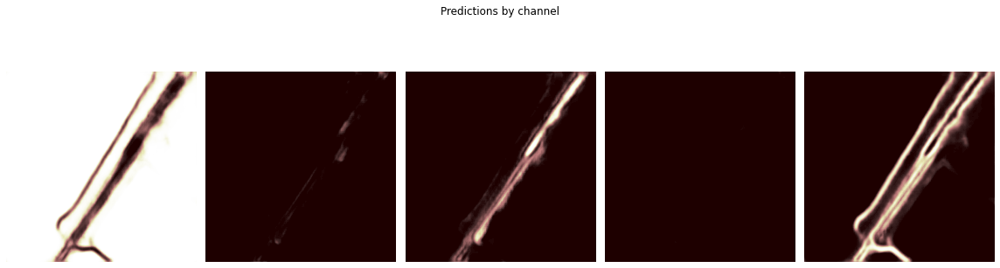

In [46]:
idx = 58

prediction = predictions_te[idx]
segmentation = segmentations_te[idx]

fig, axs = plt.subplots(nrows=1, ncols=prediction.shape[-1], figsize=(16, NUM_CLASSES))
plt.suptitle('Predictions by channel')
[axi.set_axis_off() for axi in axs.ravel()]
for i, ax in enumerate(axs):
    ax.imshow(np.squeeze(prediction[..., i]), vmin=0, vmax=1, cmap='pink')
plt.tight_layout()

In [ ]:
display_sample([X_te[idx], y_te[idx], segmentation])

### Multiclass segmentation: 10 classes

In [48]:
NUM_CLASSES=10

model = build_unet()

model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_38 (Conv2D)              (None, 256, 256, 32) 896         input_3[0][0]                    
__________________________________________________________________________________________________
dropout_36 (Dropout)            (None, 256, 256, 32) 0           conv2d_38[0][0]                  
__________________________________________________________________________________________________
conv2d_39 (Conv2D)              (None, 256, 256, 32) 9248        dropout_36[0][0]                 
______________________________________________________________________________________________

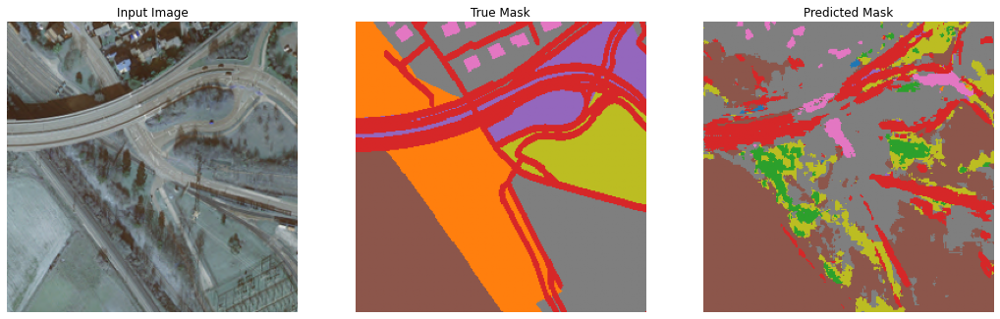


Sample Prediction after epoch 40

200/200 [==============================] - 11s 55ms/step - loss: 0.6020 - miou_2: 0.4407 - accuracy: 0.7888 - val_loss: 0.8916 - val_miou_2: 0.4458 - val_accuracy: 0.7110


In [49]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=SparseCategoricalCrossentropy(from_logits=False,
                                                 reduction="auto",
                                                 name="sparse_categorical_crossentropy"),
              metrics=[miou(num_classes=NUM_CLASSES), "accuracy"])

X_tr, X_te, y_tr, y_te = train_test_split(
    images[500:1000],
    masks[500:1000],
    test_size = 0.2,
    shuffle = True,
    random_state = SEED)

sample_image, sample_mask = (X_tr[42], y_tr[42])

NUM_EPOCHS = 80
# TRAIN_SIZE = len(X_tr)
# TEST_SIZE = len(X_te)
# STEPS_PER_EPOCH = TRAIN_SIZE // BATCH_SIZE
# VALIDATION_STEPS = TEST_SIZE // BATCH_SIZE

callbacks = [
    # show samples after each epoch
    DisplayCallback(),
    # stop training early if loss stops improving
    EarlyStopping(monitor = 'val_loss', patience=40, verbose=1),
    # reduces learning rate if loss plateaus
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, verbose=2, min_delta=1e-4)
]

model_history = model.fit(x = X_tr, y = y_tr,
                          batch_size=BATCH_SIZE,
                          epochs=NUM_EPOCHS,
                          # steps_per_epoch=STEPS_PER_EPOCH,
                          # validation_steps=VALIDATION_STEPS,
                          validation_data=(X_te, y_te),
                          verbose=1,
                          callbacks=callbacks)

#### Loss curve

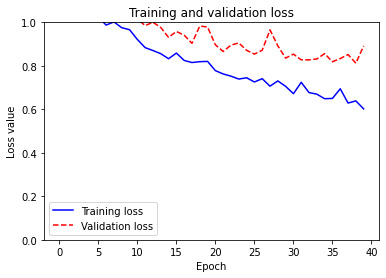

In [50]:
plot_loss_history()

#### Jaccard score (intersection over union) by class

In [51]:
predictions_tr = model.predict(X_tr, batch_size=4, verbose=0)
segmentations_tr = np.argmax(predictions_tr, axis=-1)

predictions_te = model.predict(X_te, batch_size=4, verbose=0)
segmentations_te = np.argmax(predictions_te, axis=-1)

In [52]:
print_iou()

class 0: forest
training IOU: 0.44
test IOU: 0.443

class 1: water
training IOU: 0.806
test IOU: 0.7

class 2: agricultural
training IOU: 0.875
test IOU: 0.755

class 3: urban fabric
training IOU: 0.656
test IOU: 0.57

class 4: grassland
training IOU: 0.234
test IOU: 0.165

class 5: railway
training IOU: 0.272
test IOU: 0.276

class 6: highway
training IOU: 0.329
test IOU: 0.279

class 8: road
training IOU: 0.318
test IOU: 0.306

class 9: building
training IOU: 0.603
test IOU: 0.517



#### Pixel-level confusion matrix

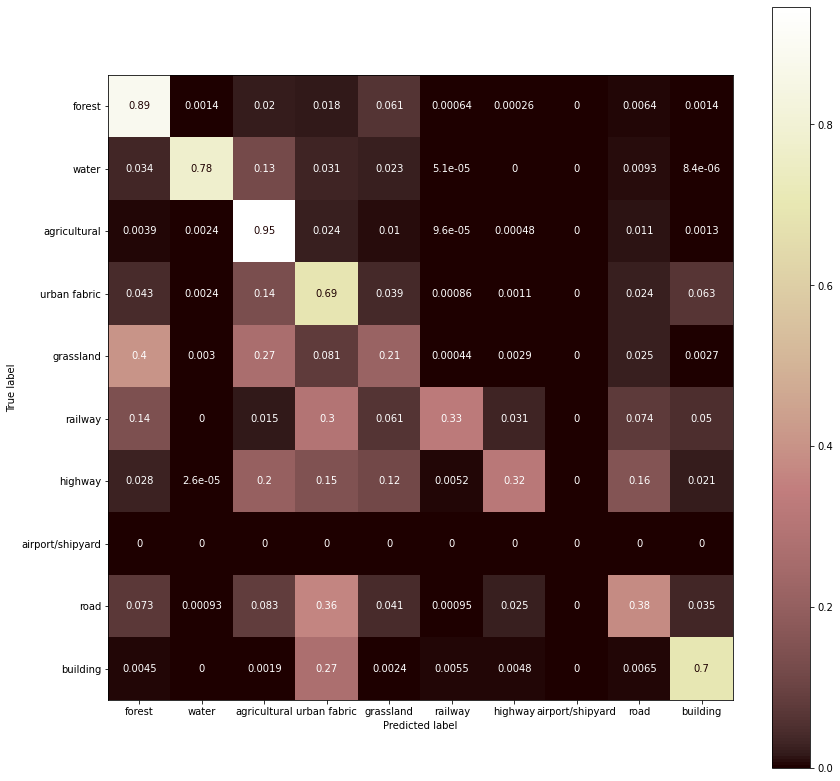

In [53]:
fig, ax = plt.subplots(figsize=(14, 14))

ConfusionMatrixDisplay.from_predictions(y_te.flatten(), segmentations_te.flatten(), 
                                        labels=range(NUM_CLASSES), display_labels=display_labels[NUM_CLASSES], 
                                        normalize='true', cmap='pink', ax=ax)

#### Plot sample predictions

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


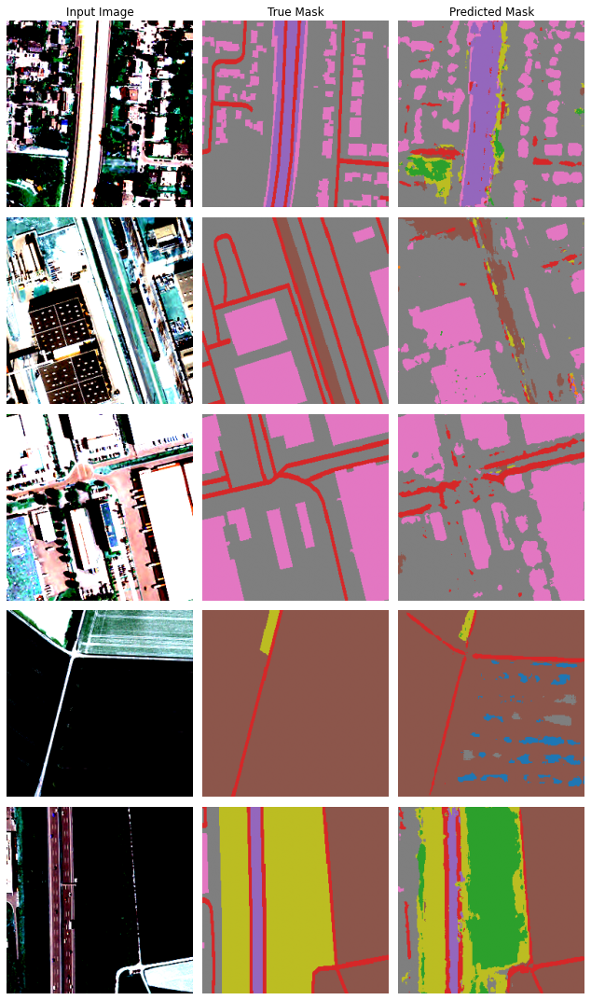

In [54]:
show_prediction_grid(X_te, y_te, segmentations_te, idx_list)

#### Plot sample prediction by channel

In [ ]:
idx = 92

prediction = predictions_te[idx]
segmentation = segmentations_te[idx]

fig, axs = plt.subplots(nrows=1, ncols=prediction.shape[-1], figsize=(16, 2.25))
[axi.set_axis_off() for axi in axs.ravel()]
plt.suptitle('Predictions by channel')
for i, ax in enumerate(axs):
    ax.imshow(np.squeeze(prediction[..., i]), vmin=0, vmax=1, cmap='pink')
    ax.set_title(i)
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()

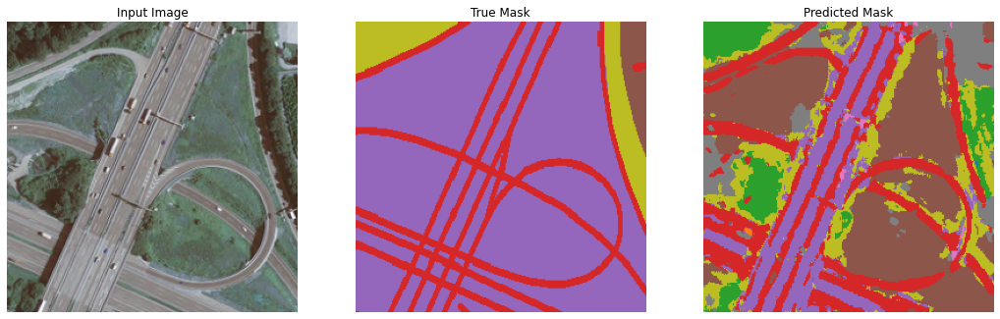

In [56]:
display_sample([X_te[idx], y_te[idx], segmentation])

## Reducing class imbalance

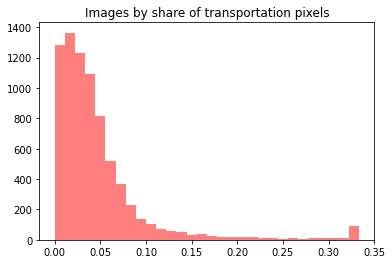

In [57]:
# get per-image share of pixels in transportation classes
img_size = images[0].size
pct_transportation = [(mask == 1).sum()/img_size for mask in masks_2]

plt.hist(pct_transportation, bins=30, color='red', alpha=0.5)
plt.title('Images by share of transportation pixels')
plt.show()

In [58]:
# delete images and masks with fewer than 2% of pixels in transportation classes
low_transpo_idx = np.where(np.asarray(pct_transportation) < 0.05)[0]

def delete_low_transpo(array):
    new_array = np.delete(array, low_transpo_idx, axis=0)
    return new_array

In [59]:
images = delete_low_transpo(images)
masks = delete_low_transpo(masks)
masks_5 = delete_low_transpo(masks_5)
masks_2 = delete_low_transpo(masks_2)

### All classes

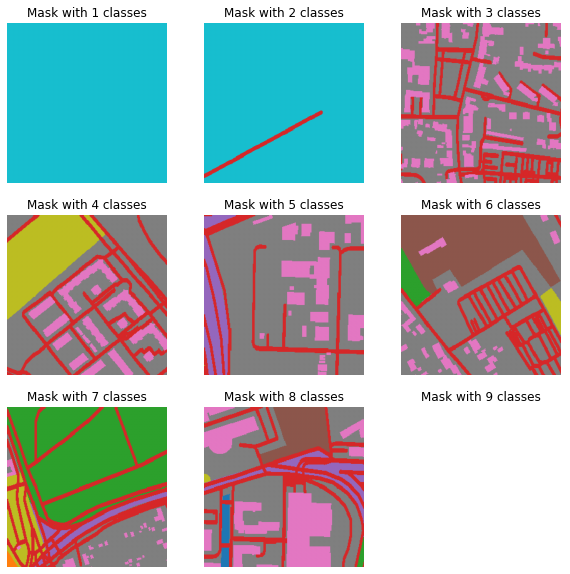

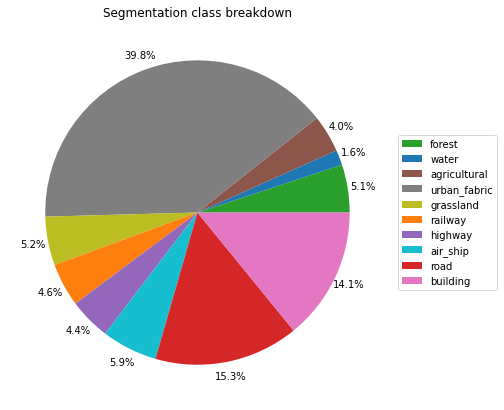

In [60]:
NUM_CLASSES =  10

# get mask indices by number of classes present
mskByClass = getMaskClasses(masks, NUM_CLASSES)

# plot examples of images with different numbers of classes
fig, axes = plt.subplots(figsize=(10,10), nrows=3, ncols=3, sharey=True)
[axi.set_axis_off() for axi in axes.ravel()]

for i in range(NUM_CLASSES-1):
    ax = axes.flatten()[i]
    ax.set_title(f'Mask with {i+1} classes')
    classMsk = masks[mskByClass[i+1]]
    if np.any(classMsk):
        idx = np.random.randint(classMsk.shape[0])
        mask = masks[mskByClass[i+1][idx]]
        ax.imshow(seg2rgb(mask, n_classes=NUM_CLASSES), vmin=0, vmax=NUM_CLASSES)
        ax.set_xlabel(idx)
        
(classNum, counts) = np.unique(masks, return_counts=True)
classNames = np.vectorize(CLASSES.get)(classNum)

plt.figure(figsize=(7, 7))
plt.pie(counts, labels=classNames, colors=cmap.colors, autopct='%1.1f%%', pctdistance=1.1, labeldistance=None)
plt.title("Segmentation class breakdown")
plt.legend(loc="center right", bbox_to_anchor=(0.8, 0, 0.5, 1))
plt.show()

In [61]:
NUM_CLASSES=10

model = build_unet()

model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_57 (Conv2D)              (None, 256, 256, 32) 896         input_4[0][0]                    
__________________________________________________________________________________________________
dropout_54 (Dropout)            (None, 256, 256, 32) 0           conv2d_57[0][0]                  
__________________________________________________________________________________________________
conv2d_58 (Conv2D)              (None, 256, 256, 32) 9248        dropout_54[0][0]                 
______________________________________________________________________________________________

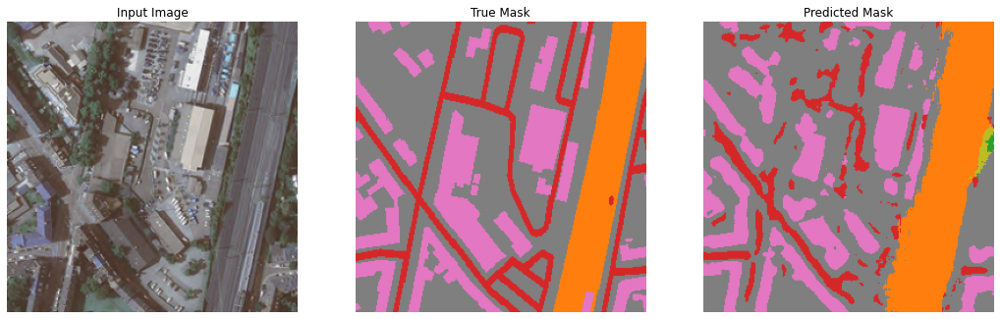


Sample Prediction after epoch 40

200/200 [==============================] - 11s 56ms/step - loss: 0.6930 - miou_3: 0.5696 - accuracy: 0.7454 - val_loss: 0.8793 - val_miou_3: 0.4455 - val_accuracy: 0.6849


In [62]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=SparseCategoricalCrossentropy(from_logits=False,
                                                 reduction="auto",
                                                 name="sparse_categorical_crossentropy"),
              metrics=[miou(num_classes=NUM_CLASSES), "accuracy"])

X_tr, X_te, y_tr, y_te = train_test_split(
    images[500:1000],
    masks[500:1000],
    test_size = 0.2,
    shuffle = True,
    random_state = SEED)

sample_image, sample_mask = (X_tr[42], y_tr[42])

NUM_EPOCHS = 80

callbacks = [
    # show samples after each epoch
    DisplayCallback(),
    # stop training early if loss stops improving
    EarlyStopping(monitor = 'val_loss', patience=40, verbose=1),
    # reduces learning rate if loss plateaus
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, verbose=2, min_delta=1e-4)
]

model_history = model.fit(x = X_tr, y = y_tr,
                          batch_size=BATCH_SIZE,
                          epochs=NUM_EPOCHS,
                          validation_data=(X_te, y_te),
                          verbose=1,
                          callbacks=callbacks)

#### Loss curve

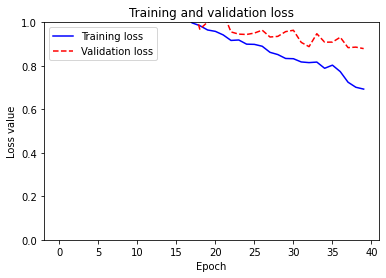

In [63]:
plot_loss_history()

#### Jaccard score (intersection over union) by class

In [64]:
predictions_te = model.predict(X_te, batch_size=4, verbose=0)
segmentations_te = np.argmax(predictions_te, axis=-1)

In [ ]:
print_iou()

#### Sample predictions

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


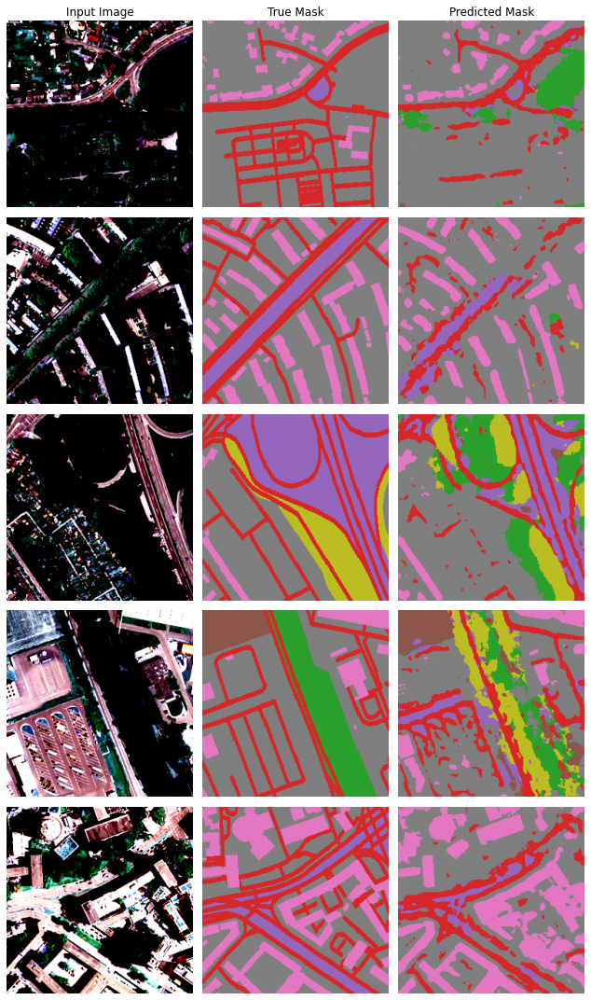

In [65]:
show_prediction_grid(X_te, y_te, segmentations_te, idx_list)

### Reduced classes

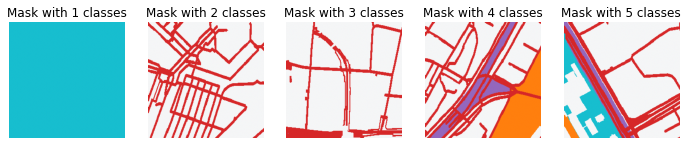

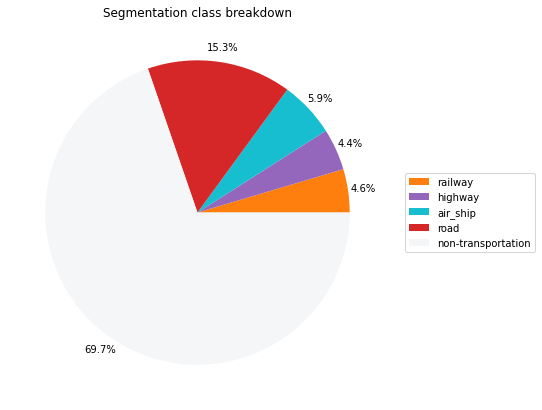

In [66]:
NUM_CLASSES = 5

# get mask indices by number of classes present
mskByClass = getMaskClasses(masks_5, NUM_CLASSES)

# plot examples of images with different numbers of classes
fig, axes = plt.subplots(figsize=(12, 3), nrows=1, ncols=NUM_CLASSES, sharey=True)
[axi.set_axis_off() for axi in axes.ravel()]

for i in range(NUM_CLASSES):
    ax = axes.flatten()[i]
    ax.set_title(f'Mask with {i+1} classes')
    classMsk = masks_5[mskByClass[i+1]]
    if np.any(classMsk):
        idx = np.random.randint(classMsk.shape[0])
        mask = masks_5[mskByClass[i+1][idx]]
        ax.imshow(seg2rgb(mask, NUM_CLASSES), vmin=0, vmax=NUM_CLASSES)

(classNum, counts) = np.unique(remap(masks_5, backmap_5), return_counts=True)
classNames = np.vectorize(CLASSES.get)(classNum)

# get reduced color map to match classes
colors_5 = [cmap.colors[i] for i in classNum]

plt.figure(figsize=(7, 7))
plt.pie(counts, labels=classNames, colors=colors_5, autopct='%1.1f%%', pctdistance=1.1, labeldistance=None)
plt.title("Segmentation class breakdown")
plt.legend(loc="center right", bbox_to_anchor=(0.9, 0, 0.5, 1))
plt.show()

In [67]:
NUM_CLASSES=5

model = build_unet()

model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_76 (Conv2D)              (None, 256, 256, 32) 896         input_5[0][0]                    
__________________________________________________________________________________________________
dropout_72 (Dropout)            (None, 256, 256, 32) 0           conv2d_76[0][0]                  
__________________________________________________________________________________________________
conv2d_77 (Conv2D)              (None, 256, 256, 32) 9248        dropout_72[0][0]                 
______________________________________________________________________________________________

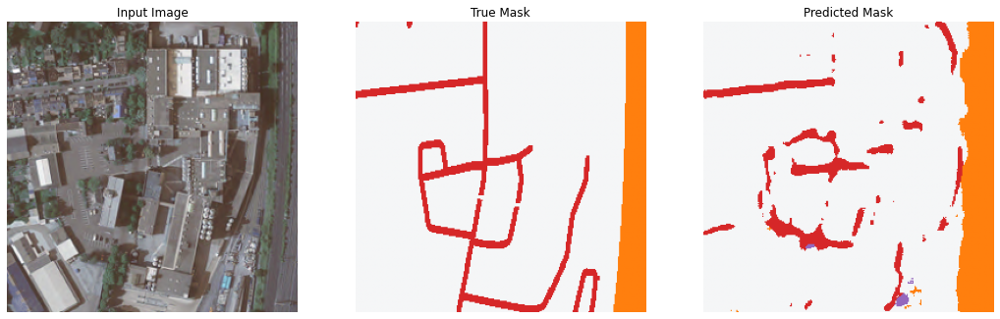


Sample Prediction after epoch 40

200/200 [==============================] - 11s 53ms/step - loss: 0.3988 - miou_4: 0.5973 - accuracy: 0.8466 - val_loss: 0.4824 - val_miou_4: 0.5450 - val_accuracy: 0.8166


In [68]:
NUM_CLASSES=5

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
              loss=SparseCategoricalCrossentropy(from_logits=False,
                                                 reduction="auto",
                                                 name="sparse_categorical_crossentropy"),
              metrics=[miou(num_classes=NUM_CLASSES), "accuracy"])

X_tr, X_te, y_tr, y_te = train_test_split(
    images[500:1000],
    masks_5[500:1000],
    test_size = 0.2,
    shuffle = True,
    random_state = SEED)

sample_image, sample_mask = (X_tr[58], y_tr[58])

NUM_EPOCHS = 40

callbacks = [
    # show samples after each epoch
    DisplayCallback(),
    # stop training early if loss stops improving
    EarlyStopping(monitor = 'val_loss', patience=20, verbose=1),
    # reduce learning rate if learning plateaus
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, verbose=1, min_delta=1e-4)
]

model_history = model.fit(x = X_tr, y = y_tr,
                          batch_size=BATCH_SIZE,
                          epochs=NUM_EPOCHS,
                          validation_data=(X_te, y_te),
                          verbose=1,
                          callbacks=callbacks)

#### Loss curve

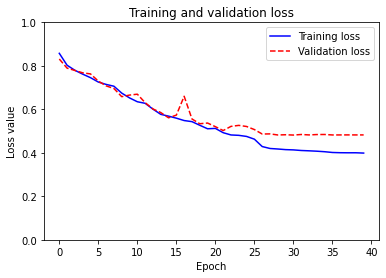

In [69]:
plot_loss_history()

#### Jaccard score (intersection over union) by class

In [70]:
predictions_te = model.predict(X_te, batch_size=4, verbose=0)
segmentations_te = np.argmax(predictions_te, axis=-1)

In [ ]:
print_iou()

#### Sample predictions

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


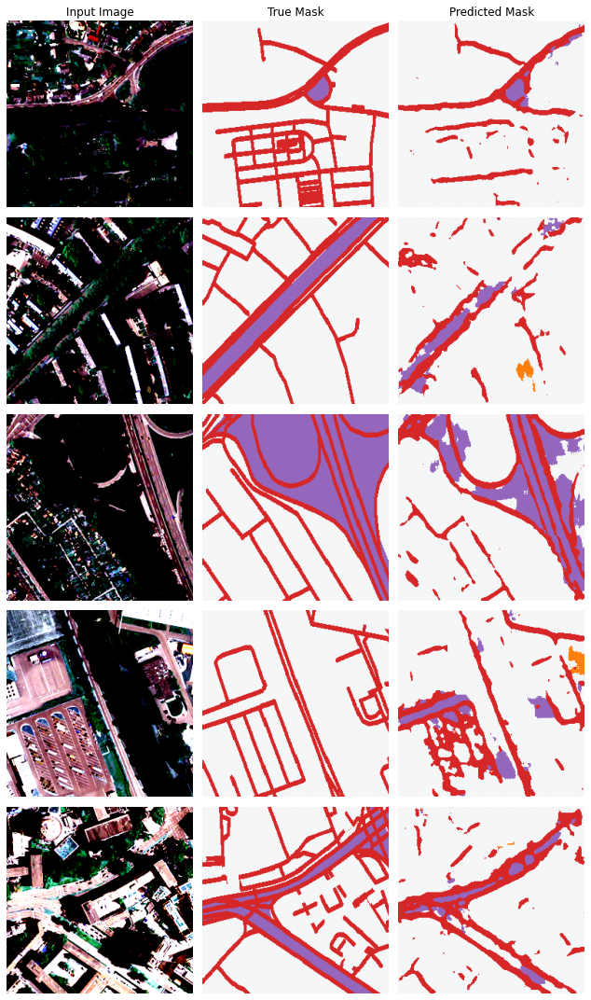

In [71]:
show_prediction_grid(X_te, y_te, segmentations_te, idx_list)

### Binary classes

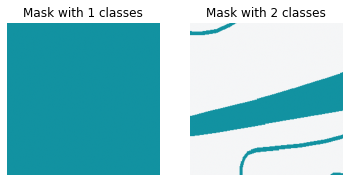

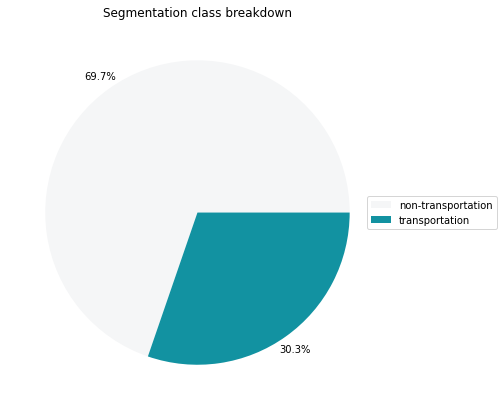

In [72]:
NUM_CLASSES = 2

# get mask indices by number of classes present
mskByClass = getMaskClasses(masks_2, NUM_CLASSES)

# plot examples of images with different numbers of classes
fig, axes = plt.subplots(figsize=(6, 3), nrows=1, ncols=NUM_CLASSES, sharey=True)
[axi.set_axis_off() for axi in axes.ravel()]

for i in range(NUM_CLASSES):
    ax = axes.flatten()[i]
    ax.set_title(f'Mask with {i+1} classes')
    classMsk = masks_2[mskByClass[i+1]]
    if np.any(classMsk):
        idx = np.random.randint(classMsk.shape[0])
        mask = masks_2[mskByClass[i+1][idx]]
        ax.imshow(seg2rgb(mask, NUM_CLASSES), vmin=0, vmax=NUM_CLASSES)
plt.show()        

(classNum, counts) = np.unique(remap(masks_2, backmap_2), return_counts=True)
classNames = np.vectorize(CLASSES.get)(classNum)

# get reduced color map to match classes
colors = [cmap.colors[i] for i in classNum]

plt.figure(figsize=(7, 7))
plt.pie(counts, labels=classNames, colors=colors, autopct='%1.1f%%', pctdistance=1.1, labeldistance=None)
plt.title("Segmentation class breakdown")
plt.legend(loc="center right", bbox_to_anchor=(0.8, 0, 0.5, 1))
plt.show()

In [73]:
NUM_CLASSES=2

model = build_unet()

model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_95 (Conv2D)              (None, 256, 256, 32) 896         input_6[0][0]                    
__________________________________________________________________________________________________
dropout_90 (Dropout)            (None, 256, 256, 32) 0           conv2d_95[0][0]                  
__________________________________________________________________________________________________
conv2d_96 (Conv2D)              (None, 256, 256, 32) 9248        dropout_90[0][0]                 
______________________________________________________________________________________________

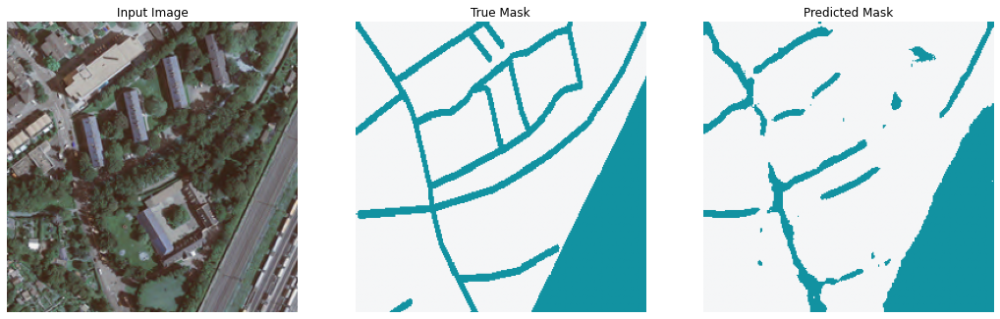


Sample Prediction after epoch 40

200/200 [==============================] - 11s 53ms/step - loss: 0.2719 - miou_5: 0.7394 - accuracy: 0.8844 - val_loss: 0.3818 - val_miou_5: 0.6563 - val_accuracy: 0.8363


In [74]:
NUM_CLASSES = 2

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
              loss=SparseCategoricalCrossentropy(from_logits=False,
                                                 reduction="auto",
                                                 name="sparse_categorical_crossentropy"),
              metrics=[miou(num_classes=NUM_CLASSES), "accuracy"])

X_tr, X_te, y_tr, y_te = train_test_split(
    images[500:1000],
    masks_2[500:1000],
    test_size = 0.2,
    shuffle = True,
    random_state = SEED)

sample_image, sample_mask = (X_tr[99], y_tr[99])

NUM_EPOCHS = 40

callbacks = [
    # show samples after each epoch
    DisplayCallback(),
    # stop training early if loss stops improving
    EarlyStopping(monitor = 'val_loss', patience=20, verbose=1),
    # reduce learning rate if loss plateaus
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, verbose=1, min_delta=1e-4)
]

model_history = model.fit(x = X_tr, y = y_tr,
                          batch_size=BATCH_SIZE,
                          epochs=NUM_EPOCHS,
                          validation_data=(X_te, y_te),
                          verbose=1,
                          callbacks=callbacks)

#### Loss curve

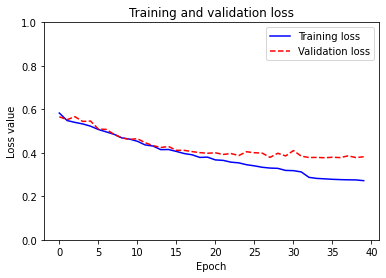

In [75]:
plot_loss_history()

#### Jaccard score (intersection over union) by class

In [76]:
predictions_te = model.predict(X_te, batch_size=4, verbose=0)
segmentations_te = np.argmax(predictions_te, axis=-1)

In [80]:
print_iou()

class 0: non-transportation
training IOU: 0.072
test IOU: 0.803

class 1: transportation
training IOU: 0.015
test IOU: 0.51



#### Sample predictions

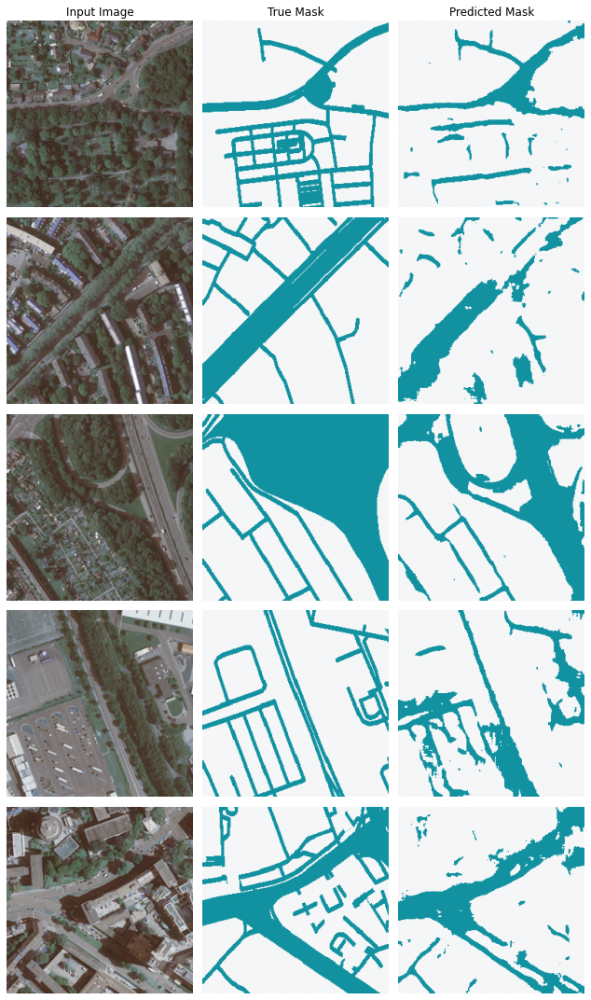

In [81]:
show_prediction_grid(X_te, y_te, segmentations_te, idx_list)